This notebook is specifically used for model training. It must be used in parallel to model evalutation if you want to use the model evaluation feature in model_main_tf2.py. Run this up to the part where you load the tensorboard, then stop.

In [1]:
# Mount my Google Drive for Google Colab
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
# Move to uploaded tensorflow directory in my Google Drive
%cd '/content/gdrive/My Drive/tensorflow/'

/content/gdrive/My Drive/tensorflow


In [3]:
# Check directory contents to see if everything is uploaded properly
!ls

addons	models	scripts  workspace


In [4]:
# Install dependencies needed for Object Detection API
!apt-get install protobuf-compiler python-lxml python-pil
!pip install Cython pandas tf-slim lvis

Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
The following additional packages will be installed:
  python-bs4 python-chardet python-html5lib python-olefile
  python-pkg-resources python-six python-webencodings
Suggested packages:
  python-genshi python-lxml-dbg python-lxml-doc python-pil-doc python-pil-dbg
  python-setuptools
The following NEW packages will be installed:
  python-bs4 python-chardet python-html5lib python-lxml python-olefile
  python-pil python-pkg-resources python-six python-webencodings
0 upgraded, 9 newly installed, 0 to remove and 37 not upgraded.
Need to get 1,614 kB of archives.
After this operation, 8,908 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 python-bs4 all 4.6.0-1 [67.9 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/main amd64 python-pkg-resources all 39.0.1-2 [128 kB]
Get:3 http:/

In [5]:
# Compile Protobuf libraries
%cd '/content/gdrive/My Drive/tensorflow/models/research/'
!protoc object_detection/protos/*.proto --python_out=.

/content/gdrive/My Drive/tensorflow/models/research


In [6]:
# Setup environment for Google Colab
import os
import sys
os.environ['PYTHONPATH']+=":/content/gdrive/My Drive/tensorflow/models"
sys.path.append("/content/gdrive/My Drive/tensorflow/models/research")

In [7]:
# Build and install libraries for Object Detection API in "tensorflow/models/research"
!python setup.py build
!python setup.py install

running build
running build_py
copying object_detection/protos/anchor_generator_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/argmax_matcher_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/bipartite_matcher_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/eval_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/calibration_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/center_net_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_predictor_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/faster_rcnn_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/faster_rcnn_box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/flexible_grid_anchor_generator_pb2.py -> 

In [8]:
# Test installation for Object Detection API
%cd '/content/gdrive/My Drive/tensorflow/models/research/object_detection/builders/'
!python model_builder_tf2_test.py
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
print('Done')

/content/gdrive/My Drive/tensorflow/models/research/object_detection/builders
2021-10-05 19:56:43.710352: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-05 19:56:43.899321: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-05 19:56:43.900087: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
Running tests under Python 3.7.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2021-10-05 19:56:43.916585: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-

Right after you loaded the tensorboard, stop and run the model evaluation notebook before you start the model training.

In [12]:
# Starting Tensorboard to monitor training and evaluation
%cd '/content/gdrive/My Drive/tensorflow/workspace/object_detector'
%load_ext tensorboard
%tensorboard --logdir=models/test_model

Output hidden; open in https://colab.research.google.com to view.

The model_main_tf2.py script was initially intended to be running in parallel to the training job, so we'll have to utilize two separate colab sessions. After you start model training, go back to model evaluation notebook and run the evaluation in parallel to model training. The model evaluation notebook will wait for the checkpoint generated by the model training in this notebook and evaluate it using the test set. Go back and run the evaluation notebook after the warm-up steps.

In [13]:
# Start model training
!python model_main_tf2.py --model_dir=models/test_model --pipeline_config_path=models/test_model/pipeline.config

2021-10-05 21:13:39.283490: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-05 21:13:39.292213: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-05 21:13:39.292811: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-05 21:13:39.294064: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-05 21:13:39.294678: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

In [14]:
# Exporting trained model for usage
!python exporter_main_v2.py --input_type=image_tensor --pipeline_config_path=models/test_model/pipeline.config --trained_checkpoint_dir=models/test_model --output_directory=exported_models/my_test_model

2021-10-06 01:10:32.797315: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-06 01:10:32.812591: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-06 01:10:32.813199: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-06 01:10:32.822058: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-06 01:10:32.822667: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

In [16]:
# Loading exported model for testing
import tensorflow as tf
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
PATH_TO_SAVED_MODEL="/content/gdrive/My Drive/tensorflow/workspace/object_detector/exported_models/my_test_model/saved_model"
print('Loading model...', end='')
# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

Loading model...Done!


In [17]:
# Loading our label map (roadsign_labels.pbtxt)
category_index = label_map_util.create_category_index_from_labelmap("/content/gdrive/My Drive/tensorflow/workspace/object_detector/annotations/roadsign_labels.pbtxt", use_display_name=True)

In [18]:
def get_img_list_from_dir(path):
  img_list = []
  for file in os.listdir(path):
    if file.endswith('.png'):
      img_list.append(path + file)
  return img_list

In [19]:
# Loading images from images/test directory
img_all = get_img_list_from_dir('/content/gdrive/My Drive/tensorflow/workspace/object_detector/images/test/')

In [20]:
# Import random for image selection
import random

# Select 10 images at random
img = random.sample(img_all, 10)

Running inference for /content/gdrive/My Drive/tensorflow/workspace/object_detector/images/test/road529.png... Done


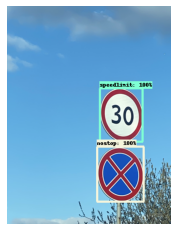

Running inference for /content/gdrive/My Drive/tensorflow/workspace/object_detector/images/test/road286.png... Done


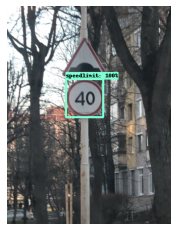

Running inference for /content/gdrive/My Drive/tensorflow/workspace/object_detector/images/test/road105.png... Done


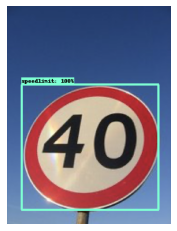

Running inference for /content/gdrive/My Drive/tensorflow/workspace/object_detector/images/test/road97.png... Done


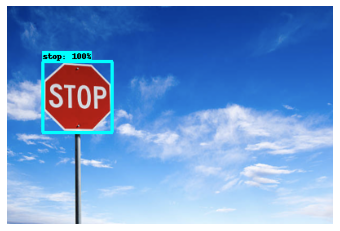

Running inference for /content/gdrive/My Drive/tensorflow/workspace/object_detector/images/test/road756.png... Done


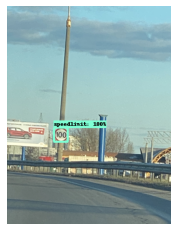

Running inference for /content/gdrive/My Drive/tensorflow/workspace/object_detector/images/test/road503.png... Done


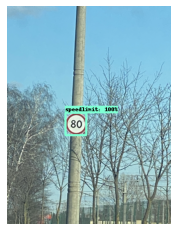

Running inference for /content/gdrive/My Drive/tensorflow/workspace/object_detector/images/test/road69.png... Done


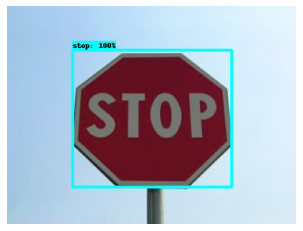

Running inference for /content/gdrive/My Drive/tensorflow/workspace/object_detector/images/test/road234.png... Done


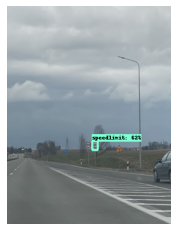

Running inference for /content/gdrive/My Drive/tensorflow/workspace/object_detector/images/test/road659.png... Done


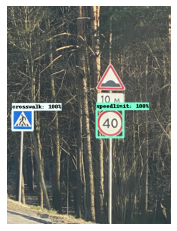

Running inference for /content/gdrive/My Drive/tensorflow/workspace/object_detector/images/test/road464.png... Done


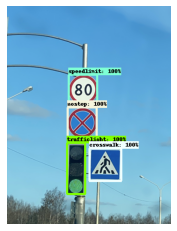

In [21]:
# Running inference on randomly selected images
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Takes image and loads them with RGB scale
def load_image_into_numpy_array(path):
  return np.array(Image.open(path).convert('RGB'))

for image_path in img:
  print('Running inference for {}... '.format(image_path), end='')
  image_np = load_image_into_numpy_array(image_path)

  input_tensor = tf.convert_to_tensor(image_np)
  input_tensor = input_tensor[tf.newaxis, ...]
  detections = detect_fn(input_tensor)
  num_detections = int(detections.pop('num_detections'))
  detections = {key:value[0,:num_detections].numpy() for key,value in detections.items()}
  detections['num_detections'] = num_detections
  detections['detection_classes'] = detections['detection_classes'].astype(np.int64)
  image_np_with_detections=image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=100,     
          min_score_thresh=.5,      
          agnostic_mode=False)
  %matplotlib inline
  plt.imshow(image_np_with_detections)
  plt.axis('off')
  print('Done')
  plt.show()